# Clustering Analysis: Exploring Methods and Performance

Clustering is a powerful tool in unsupervised learning—it helps uncover hidden patterns and groupings in data without the need for labels. Whether you're segmenting users, organizing content, or exploring structure in biological or textual data, clustering often serves as a starting point for deeper analysis.

In this notebook, we take a practical look at several clustering algorithms to understand how they behave on our dataset. The goal is to compare their performance, get a feel for the kind of structures they capture, and explore how results change with different feature representations.

---

## What This Notebook Covers

**1. Feature Extraction**  
We start by preparing the data and extracting meaningful features that will serve as input to the clustering algorithms.

**2. Applying Clustering Algorithms**  
We apply a range of methods—from density-based to hierarchical to partitioning and graph-based approaches. These include:
- HDBSCAN, DBSCAN, OPTICS
- KMeans, KMeans++
- FINCH, hierarchical agglomerative clustering (HAC), Ward
- Spectral clustering
- BIRCH

**3. Evaluating Clustering Performance**  
We measure runtime and peak memory usage for each algorithm. When labels are available, we’ll also use clustering quality metrics like silhouette score and adjusted Rand index.

**4. Qualitative Analysis**  
We'll visualize clustering results using dimensionality reduction (e.g., PCA, UMAP) to better understand how the algorithms separate the data and whether the results make intuitive sense.

**5. Comparing High-Dimensional vs Low-Dimensional Clustering**  
Finally, we’ll compare how clustering performs in the original high-dimensional space versus after projecting the data to a lower-dimensional space.

---

By the end of this notebook, you should have a good sense of which clustering methods work best for your data, how computationally demanding they are, and how dimensionality impacts both clustering quality and interpretation.


# Preliminaries



In [1]:
from utils.data import create_imagenette_dataloader, get_transforms
from utils.feature_extraction import extract_features
from utils.visualize import *
from utils.eval import evaluate_clustering
import os

Loading Model: siglip2


/Users/constantinseibold/workspace/CVPR_Tutorial/Identifying_Structure_In_Data/clustering/image_clustering/feature_extraction.py:45: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():
/opt/anaconda3/envs/tutorial/lib/python3.11/site-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(


Loaded Model: siglip2
Beginning Feature Extraction


100%|██████████| 148/148 [01:14<00:00,  2.00it/s]


feature shape (9469, 768)
labels shape (9469,)
Applying Dimensionality reduction
Visualize Embeddings


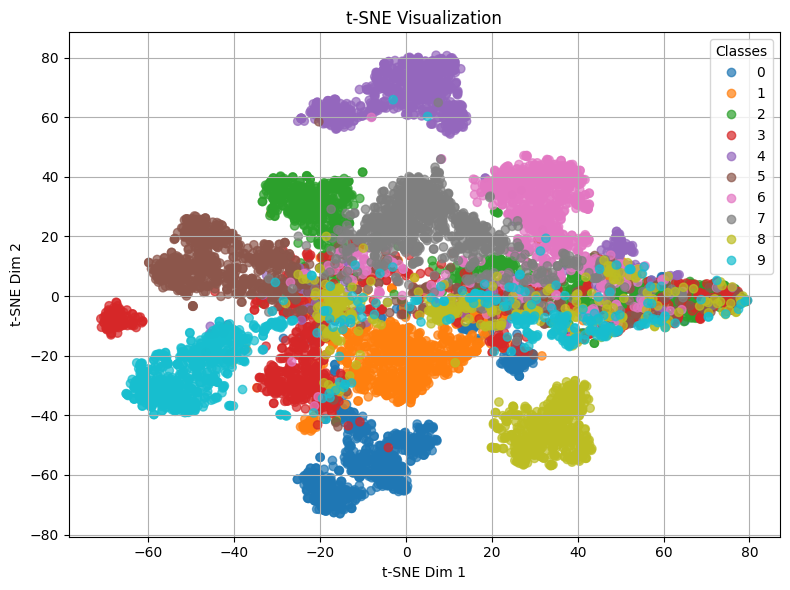

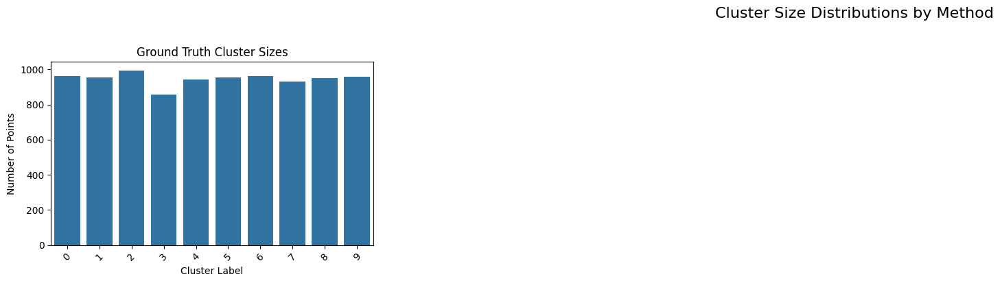

In [2]:
data_path =os.getenv('IMAGENETTE_PATH')
data_path='/Users/constantinseibold/workspace/datasets/imagenette2-320'
transform = get_transforms()
dataloader = create_imagenette_dataloader(data_path, transform=transform)
features, labels = extract_features("siglip2", dataloader)
reduced_features = apply_tsne(features)
plot_tsne(reduced_features, labels)
plot_label_distributions({"Ground Truth": labels})

# Clustering Methods


## KMeans

KMeans is a partitional clustering algorithm that partitions data into *K* clusters by iteratively assigning each point to the nearest cluster centroid and then updating centroids to the mean of their points. The algorithm minimizes the total within-cluster variance (sum of squared distances). Its strengths are simplicity and speed – it typically converges quickly in practice and is scalable to large datasets. KMeans works best when clusters are roughly spherical and of similar size. The original KMeans algorithm was described by Lloyd (1982) ([paper](https://hal.science/hal-04614938v1/document)). A widely-used implementation is available in scikit-learn’s `KMeans` class [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

## KMeans++

KMeans++ is an improved initialization scheme for KMeans that chooses initial cluster centers probabilistically to speed up convergence and improve clustering quality. It picks the first center at random, then each subsequent center with probability proportional to its squared distance from the closest existing center. This “careful seeding” yields a solution that is provably close to optimal (within *O*(log *k*) of the best) and often greatly improves speed and accuracy. In practice, KMeans++ usually finds better clusters with fewer iterations. The method was introduced by Arthur and Vassilvitskii (2007) ([paper](http://theory.stanford.edu/~sergei/papers/kMeansPP-soda.pdf)). It is implemented by default in most KMeans libraries (e.g. scikit-learn’s `KMeans` uses KMeans++ initialization by default) [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).

## DBSCAN

DBSCAN (Density-Based Spatial Clustering of Applications with Noise) clusters points based on density. It groups together points that have at least *MinPts* neighbors within a radius *ε*, and labels points in sparse regions as noise. Clusters can have arbitrary shape because points are connected by density-reachability rather than centroid distance. Strengths of DBSCAN include: it does not require specifying the number of clusters (only *ε* and *MinPts*), it can find arbitrarily-shaped clusters, and it naturally identifies outliers as noise. It is efficient on large datasets and often outperforms other methods (e.g. it is more effective at finding complex shapes than CLARANS and over 100× faster in tests). The original DBSCAN paper by Ester *et al.* (1996) introduced the algorithm and demonstrated its advantages ([paper](https://cdn.aaai.org/KDD/1996/KDD96-037.pdf)). A common implementation is scikit-learn’s `DBSCAN` (and also in many other libraries) [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html).

## HDBSCAN

HDBSCAN (Hierarchical DBSCAN) extends DBSCAN to a hierarchical and parameter-light algorithm. It builds a cluster hierarchy over all density levels (effectively integrating DBSCAN’s results for varying *ε*) and then extracts a flat clustering by choosing the most “stable” clusters in the hierarchy. In practice HDBSCAN requires only one parameter (minimum cluster size) and automatically selects clusters of varying densities and persistence. Its strengths are that it can find clusters of different densities without manual tuning and handles noise robustly. For example, HDBSCAN finds clusters of varying densities and is more robust to parameter choices than DBSCAN. The core ideas were published by Campello *et al.* (2015) in *TKDD* ([paper](https://repositorio.usp.br/bitstream/handle/BDPI/51005/2709770.pdf)). A high-performance implementation is provided by the `hdbscan` Python library [implementation](https://hdbscan.readthedocs.io/en/latest/).

## OPTICS

OPTICS (Ordering Points To Identify the Clustering Structure) is a density-based method similar to DBSCAN but designed to handle varying densities. Instead of producing a fixed clustering, OPTICS creates an augmented ordering of the points (the “reachability plot”) which encodes the data’s density structure. Each point is assigned a “reachability distance” reflecting the density level at which it would become reachable, allowing one to extract clusters at any density threshold. The strength of OPTICS is that it can identify clusters across a range of scales without picking a single *ε*. It can effectively discover nested or hierarchical clusters and is less sensitive to parameter choice. For example, OPTICS can reveal clusters at multiple density levels, addressing DBSCAN’s limitation in datasets with uneven density. The original OPTICS algorithm was introduced by Ankerst *et al.* (1999) ([paper](https://www.dbs.ifi.lmu.de/Publikationen/Papers/OPTICS.pdf)). A standard implementation is available in scikit-learn as `OPTICS` [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.OPTICS.html).

## FINCH

FINCH (First Integer Neighbor Clustering Hierarchy) is a recent parameter-free clustering method. It links each point to its nearest neighbor (first neighbor) to form chains that reveal the data’s grouping. The key idea is that first-neighbor relations induce clusters at all scales without any distance threshold or *K*. Thus FINCH needs no hyperparameters (no *ε*, no *K*), and it produces a hierarchical clustering in one pass. Its strengths are speed and simplicity: it is extremely fast (linear time) and fully automatic. In practice, FINCH often outperforms other methods on large datasets while requiring no parameter tuning. For example, FINCH achieves high clustering quality on millions of points with just a single data pass. The algorithm was proposed by Sarfraz *et al.* (CVPR 2019) ([paper](http://openaccess.thecvf.com/content_CVPR_2019/papers/Sarfraz_Efficient_Parameter-Free_Clustering_Using_First_Neighbor_Relations_CVPR_2019_paper.pdf)). The authors provide a Python implementation (`finch-clust` library) for use in practice [implementation](https://pypi.org/project/finch-clust/).

## Spectral Clustering

Spectral clustering uses graph eigenvectors to partition data. It builds a similarity graph of the points (often using a Gaussian kernel or *k*-NN) and computes the graph Laplacian. The algorithm then takes the top *k* eigenvectors of the Laplacian, stacks them to form a low-dimensional embedding, and applies a standard clustering (usually KMeans) in this spectral space. This approach can capture complex cluster structures because it embeds data respecting global connectivity. Its strength is especially in detecting non-convex clusters: for example, spectral clustering works very well for data where clusters are nested or not well described by simple centroids (e.g. concentric circles). It is also closely related to normalized graph cuts in the similarity graph. A simple spectral clustering algorithm was formalized by Ng *et al.* (NIPS 2001) ([paper](https://papers.nips.cc/paper/8012-on-spectral-clustering-analysis-and-an-algorithm.pdf)). A reliable implementation is available in scikit-learn’s `SpectralClustering` class [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html).

## Hierarchical Agglomerative Clustering (HAC)

Hierarchical agglomerative clustering builds a hierarchy of clusters bottom-up. It starts with each point as its own cluster and repeatedly merges the closest pair of clusters (according to some linkage metric) until all points are in one cluster, producing a dendrogram. Different linkage criteria (single, complete, average, etc.) yield different behaviors. A strength of HAC is that it requires no pre-specified *K* – one can cut the dendrogram at the desired level to get any number of clusters. It is deterministic and can capture multi-scale relationships in the data. HAC is very general: for example, using Euclidean distances with average linkage yields one algorithm, while using complete linkage yields another. A common implementation is scikit-learn’s `AgglomerativeClustering` class [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html).

## Ward’s Method

Ward’s method is a specific agglomerative criterion (often called “minimum variance”) for HAC. At each step, it merges the pair of clusters whose union produces the smallest increase in total within-cluster variance. Equivalently, Ward’s method minimizes the increase in sum of squared distances (error) after each merge. The result is that clusters tend to be compact and roughly spherical. Strengths of Ward’s method include its statistical grounding and tendency to give good clusterings when clusters are globular. The original formulation was given by Ward (1963) ([paper](https://iv.cns.iu.edu/sw/data/ward.pdf)). In practice, you can use Ward’s method via scikit-learn by setting `linkage='ward'` in `AgglomerativeClustering` [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html).

## BIRCH

BIRCH (Balanced Iterative Reducing and Clustering using Hierarchies) is designed for very large datasets. It incrementally builds a compact summary of the data called a CF-tree (cluster feature tree) while scanning the data. Each node in the CF-tree stores cluster summaries (centroids, counts, etc.), and BIRCH incrementally inserts points into this tree, occasionally splitting nodes when they become too large. This allows a single or a few scans of the data, making BIRCH highly efficient in time and memory. Strengths of BIRCH include its scalability and ability to handle noise: it can find a good clustering (often in one scan) using limited memory, even on millions of points. The method was introduced by Zhang *et al.* (SIGMOD 1996) ([paper](https://www2.cs.sfu.ca/CourseCentral/459/han/papers/zhang96.pdf)). A standard implementation is scikit-learn’s `Birch`, which constructs the CF-tree and then optionally reclusters the leaves [implementation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.Birch.html).


### Running Clustering 

In [30]:
# === Density-based methods ===
def run_hdbscan(features):
    print('Running: hdbscan')
    return hdbscan.HDBSCAN(min_cluster_size=10).fit_predict(features)

def run_dbscan(features):
    print('Running: dbscan')
    return DBSCAN(eps=0.1, min_samples=10).fit_predict(features)

def run_optics(features):
    print('Running: optics')
    return OPTICS(min_samples=10, xi=0.005, min_cluster_size=100).fit_predict(features)

# === Partition-based methods ===
def run_kmeans(features):
    print('Running: kmeans')
    return KMeans(n_clusters=10, init='random', random_state=42).fit_predict(features)

def run_kmeans_pp(features):
    print('Running: kmeans_pp')
    return KMeans(n_clusters=10, init='k-means++', random_state=42).fit_predict(features)

# === Hierarchical methods ===
def run_finch(features, n_clusters=None):
    print('Running: finch')
    c, _, req_c = FINCH(features, req_clust=n_clusters)
    if n_clusters is None:
        return c[:, -2]
    return req_c

def run_hac(features):
    print('Running: hac')
    return AgglomerativeClustering(n_clusters=10, linkage='average').fit_predict(features)

def run_ward(features):
    print('Running: ward')
    return AgglomerativeClustering(n_clusters=10, linkage='ward').fit_predict(features)

# === Graph-based / Spectral method ===
def run_spectral(features):
    print('Running: spectral')
    return SpectralClustering(n_clusters=10, affinity='nearest_neighbors', assign_labels='kmeans', random_state=42).fit_predict(features)

# === Model-based method ===
def run_birch(features):
    print('Running: birch')
    return Birch(n_clusters=10).fit_predict(features)


In [31]:

# === Profiling wrapper ===
def profile_clustering(func, *args, **kwargs):
    from memory_profiler import memory_usage
    mem_usage, result = memory_usage((func, args, kwargs), retval=True, max_usage=True)
    return result, mem_usage

def cluster_and_time(func, *args, **kwargs):
    from time import time
    start = time()
    result, mem = profile_clustering(func, *args, **kwargs)
    end = time()
    return result, end - start, mem


In [ ]:
import numpy as np
import hdbscan
from sklearn.cluster import DBSCAN, KMeans, OPTICS, SpectralClustering, AgglomerativeClustering, Birch
from sklearn.metrics import pairwise_distances
from finch import FINCH
from time import time
from visualize import plot_label_distributions

# Execute and store results
_, hdbscan_time, hdbscan_mem = cluster_and_time(run_hdbscan, features)
_, dbscan_time, dbscan_mem = cluster_and_time(run_dbscan, features)
_, optics_time, optics_mem = cluster_and_time(run_optics, features)

_, kmeans_time, kmeans_mem = cluster_and_time(run_kmeans, features)
_, kmeans_pp_time, kmeans_pp_mem = cluster_and_time(run_kmeans_pp, features)

_, finch_time, finch_mem = cluster_and_time(run_finch, features, n_clusters=10)
_, hac_time, hac_mem = cluster_and_time(run_hac, features)
_, ward_time, ward_mem = cluster_and_time(run_ward, features)

_, spectral_time, spectral_mem = cluster_and_time(run_spectral, features)

_, birch_time, birch_mem = cluster_and_time(run_birch, features)

# Summary
times = {
    'HDBSCAN': hdbscan_time,
    'DBSCAN': dbscan_time,
    'OPTICS': optics_time,
    'KMeans': kmeans_time,
    'KMeans++': kmeans_pp_time,
    'FINCH': finch_time,
    'HAC': hac_time,
    'Ward': ward_time,
    'Spectral': spectral_time,
    'BIRCH': birch_time,
}

memory_usage_mb = {
    'HDBSCAN': hdbscan_mem,
    'DBSCAN': dbscan_mem,
    'OPTICS': optics_mem,
    'KMeans': kmeans_mem,
    'KMeans++': kmeans_pp_mem,
    'FINCH': finch_mem,
    'HAC': hac_mem,
    'Ward': ward_mem,
    'Spectral': spectral_mem,
    'BIRCH': birch_mem,
}



hdbscan_labels, _, _ = cluster_and_time(run_hdbscan, features)
dbscan_labels, _, _ = cluster_and_time(run_dbscan, features)
optics_labels, optics_time, _ = cluster_and_time(run_optics, features)
kmeans_labels, _, _ = cluster_and_time(run_kmeans, features)
kmeans_pp_labels, _, _ = cluster_and_time(run_kmeans_pp, features)
finch_labels, _, _ = cluster_and_time(run_finch, features, n_clusters=10)
hac_labels, _, _ = cluster_and_time(run_hac, features)
ward_labels, _, _ = cluster_and_time(run_ward, features)
spectral_labels, _, _ = cluster_and_time(run_spectral, features)
birch_labels, _, _ = cluster_and_time(run_birch, features)


labels_dict = {
    'HDBSCAN': hdbscan_labels,
    'DBSCAN': dbscan_labels,
    'KMeans': kmeans_labels,
    'KMeans++': kmeans_pp_labels,
    'FINCH': finch_labels,
    'OPTICS': optics_labels,
    'Spectral': spectral_labels,
    'HAC': hac_labels,
    'Ward': ward_labels,
    'BIRCH': birch_labels
}

Running: optics


### Investigating Results

#### Clustering Evaluation Metrics

The `evaluate_clustering` function compares the predicted clustering results against ground truth labels using several standard metrics from `sklearn.metrics`. Each metric quantifies a different aspect of clustering quality:

1. **Adjusted Rand Index (ARI)**
- **Function**: `adjusted_rand_score(gt_labels, labels)`
- **Purpose**: Measures the similarity between two clusterings by considering all pairs of samples and counting pairs that are assigned in the same or different clusters in the predicted and true clusterings.
- **Range**: `[-1, 1]` (where 1 indicates perfect match, 0 is random labeling, and negative values indicate worse than random)
- **Advantages**: Adjusts for chance grouping, making it suitable for comparing results of different clustering algorithms.

2. **Normalized Mutual Information (NMI)**
- **Function**: `normalized_mutual_info_score(gt_labels, labels)`
- **Purpose**: Measures the amount of shared information between the true and predicted cluster assignments, normalized to scale the result.
- **Range**: `[0, 1]` (0 = no mutual information, 1 = perfect correlation)
- **Advantages**: Useful when the number of clusters differs in the predicted and true labels. Symmetric and independent of label permutations.

3. **Fowlkes-Mallows Index (FMI)**
- **Function**: `fowlkes_mallows_score(gt_labels, labels)`
- **Purpose**: Geometric mean of the precision and recall when treating clustering as a binary classification task over sample pairs.
- **Range**: `[0, 1]` (1 = perfect clustering)
- **Advantages**: Simple and intuitive metric that evaluates how well pairs of points are clustered.

4. **Silhouette Score**
- **Function**: `silhouette_score(features, labels)`
- **Purpose**: Evaluates how well each sample lies within its cluster based on intra-cluster distance and nearest-cluster distance.
- **Range**: `[-1, 1]` (higher is better; -1 = incorrect clustering, 0 = overlapping clusters, 1 = well-separated clusters)
- **Requirements**: Needs at least two clusters. Returns `-1` if only one cluster is present.
- **Advantages**: Unsupervised metric that doesn't require ground truth.

**Preprocessing Note**
Before evaluation, noise points labeled as `-1` (common in DBSCAN/HDBSCAN) are removed to ensure meaningful metric computation.


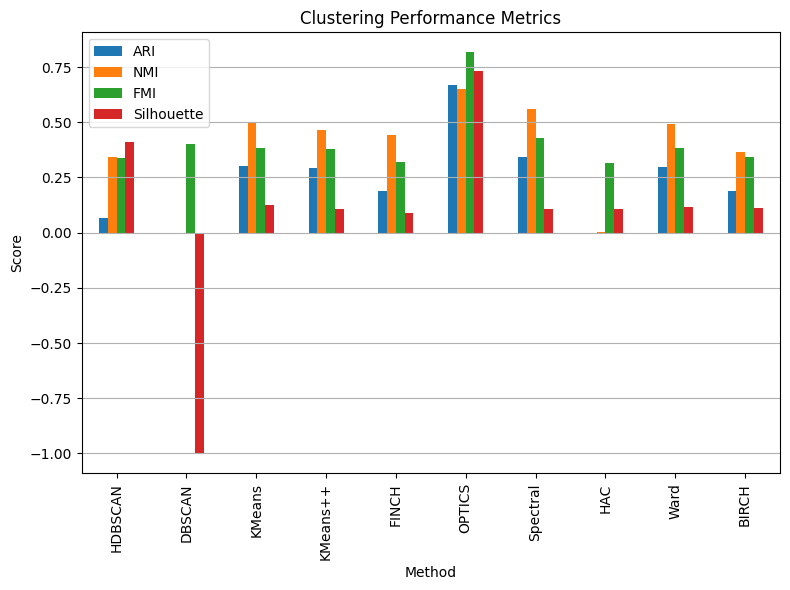

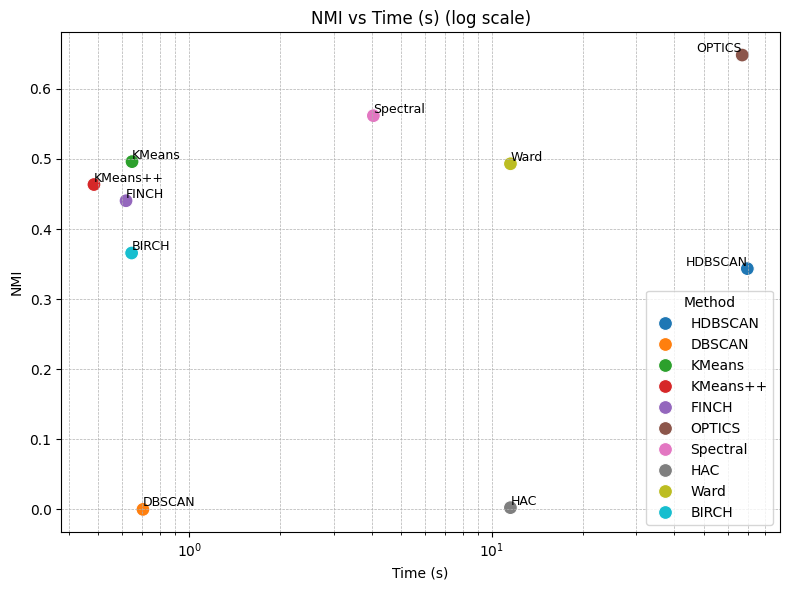

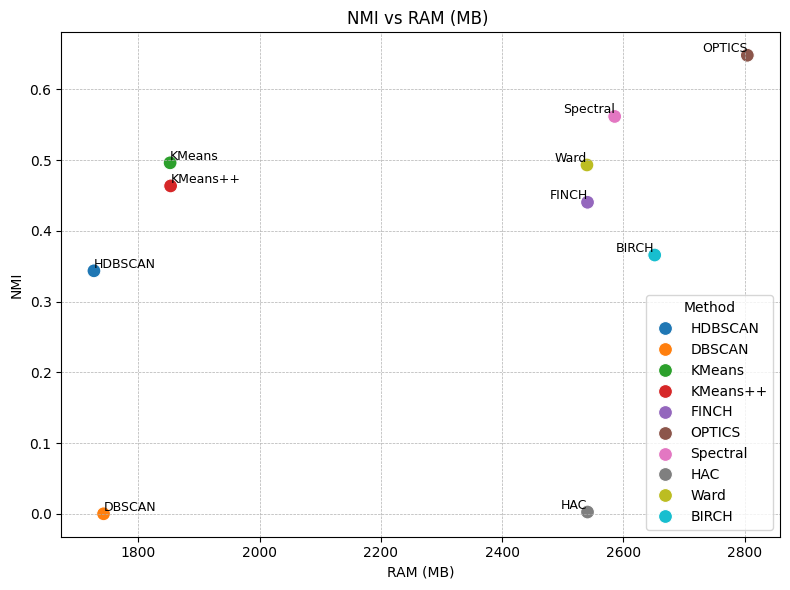

In [33]:
# Evaluate all clusterings
results = {
    key: evaluate_clustering(labels_dict[key], labels, features) for key in labels_dict
}

df = build_results_dataframe(results, times, memory_usage_mb)
plot_performance_metrics(df)
plot_efficiency_vs_performance(df, log_x=True)
plot_efficiency_vs_performance(df, x_metric='RAM (MB)')

#### Visualize the Distributions

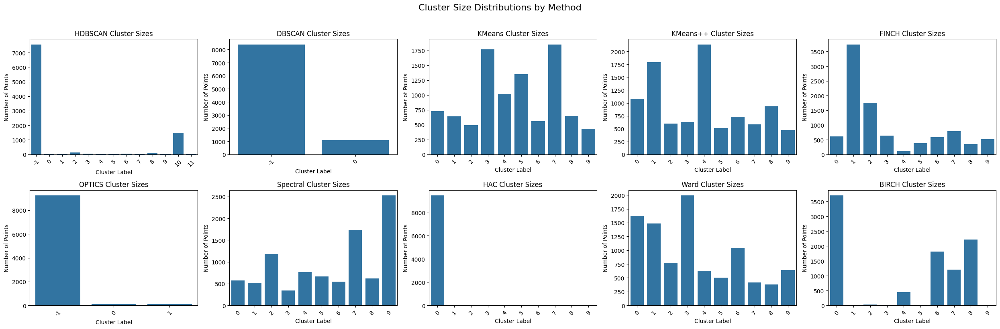

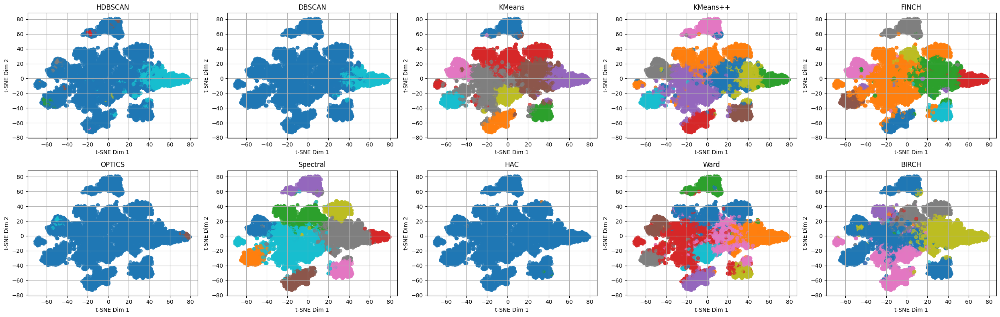

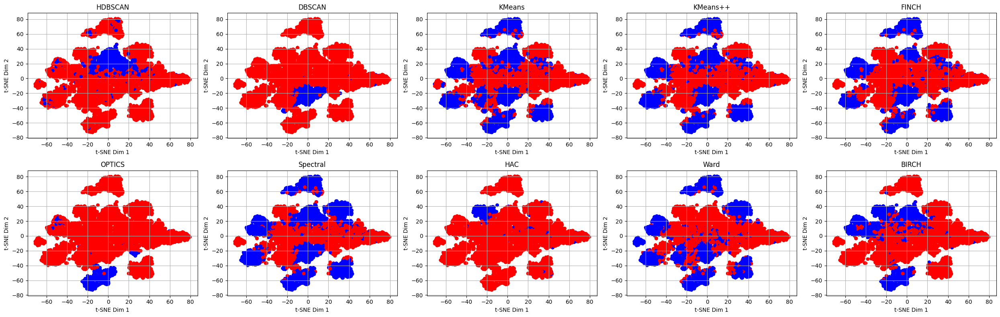

In [34]:
plot_label_distributions(labels_dict)
plot_multiple_tsne_variants(reduced_features, labels_dict.values(), list(labels_dict.keys()), n_cols=5)
plot_cluster_label_matches_variants(reduced_features, labels, labels_dict.values(), list(labels_dict.keys()), n_cols=5)

#### Looking into the clusters:

clustering of HDBSCAN


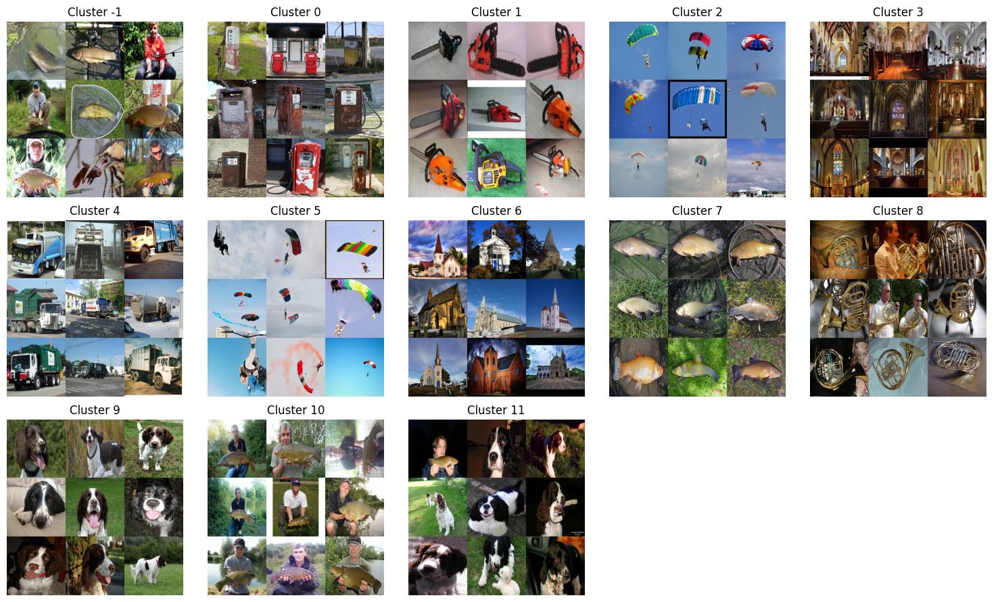

clustering of DBSCAN


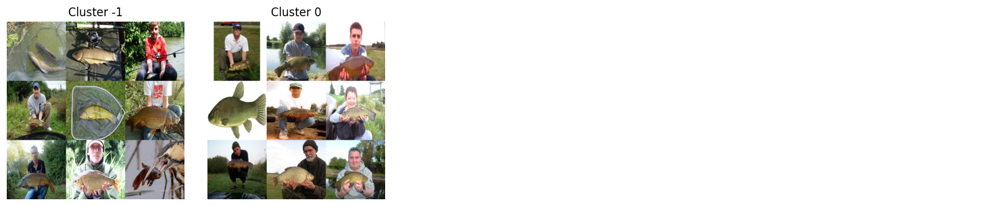

clustering of KMeans


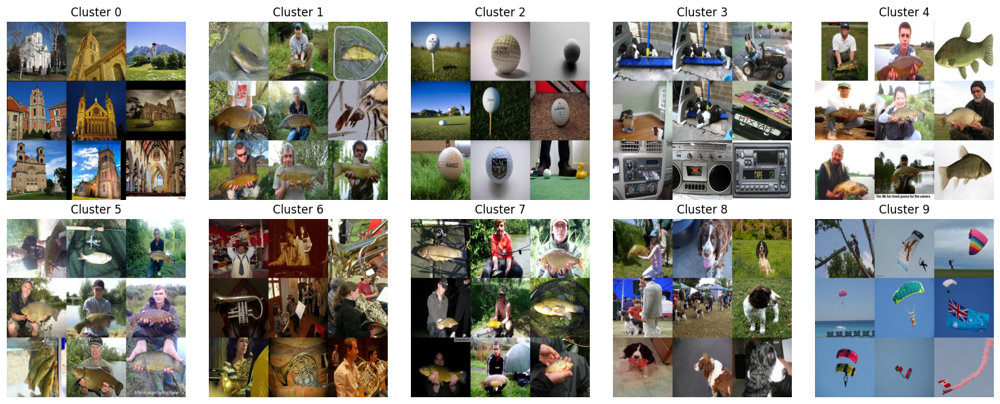

clustering of KMeans++


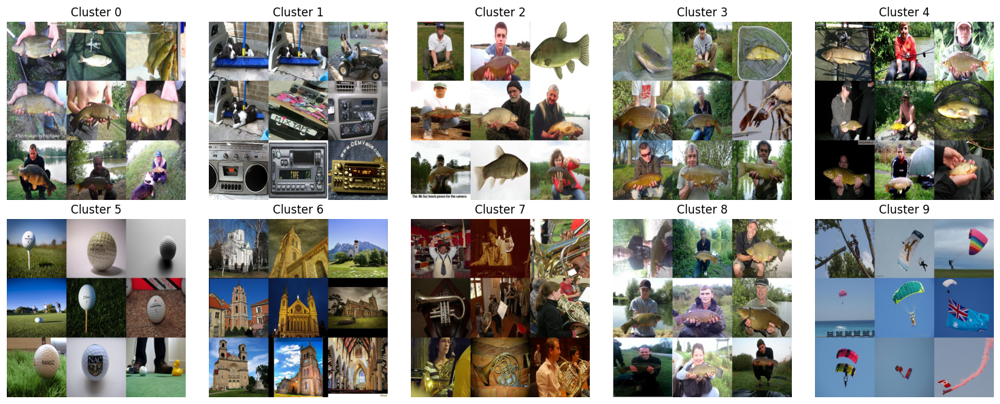

clustering of FINCH


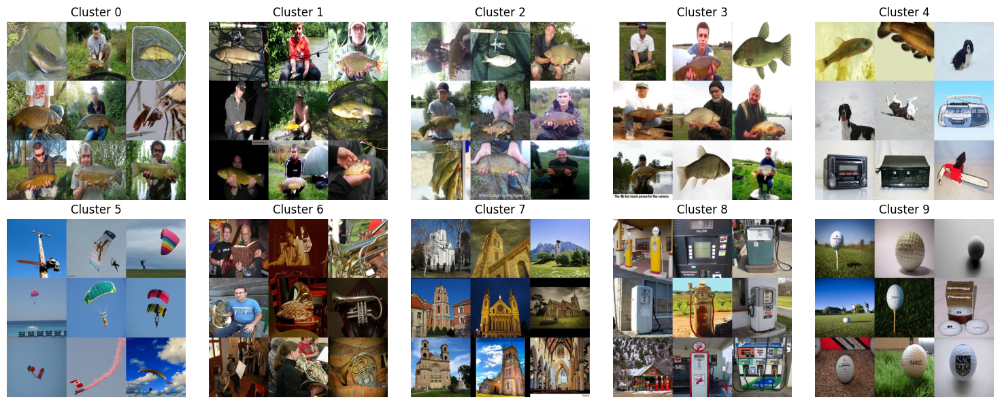

clustering of OPTICS


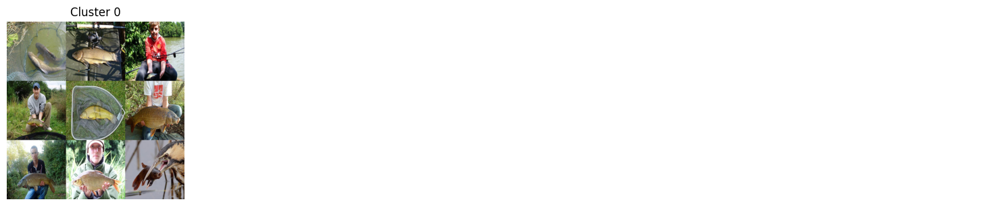

clustering of Spectral


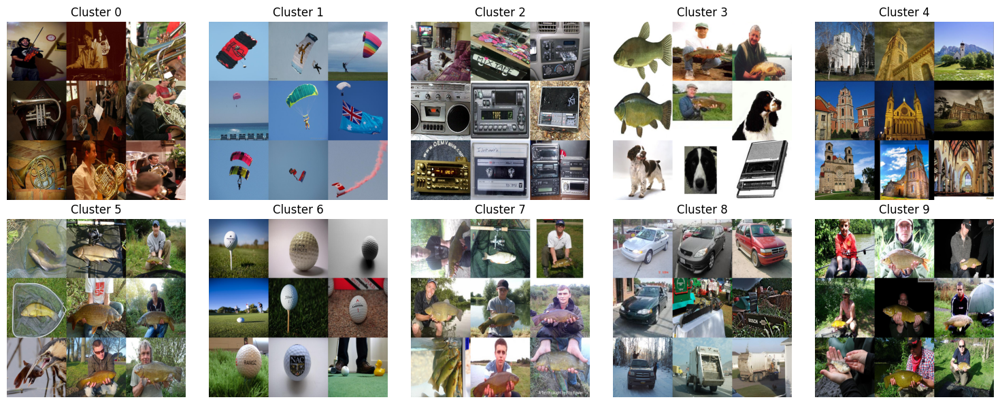

clustering of HAC


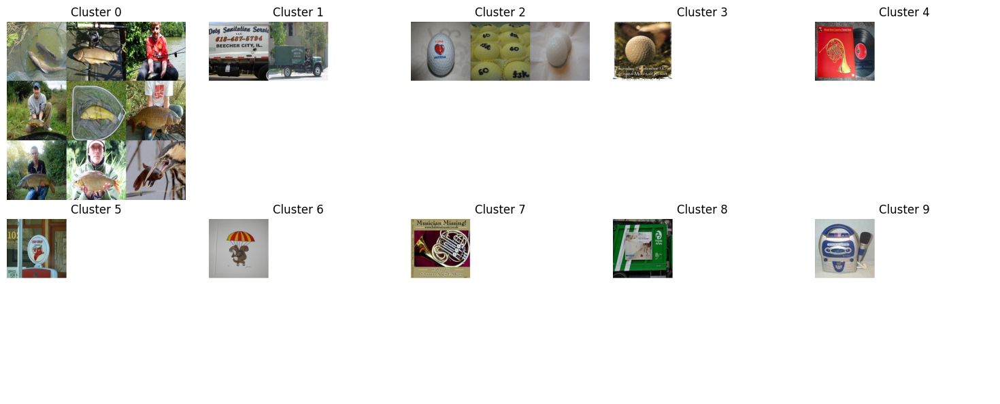

clustering of Ward


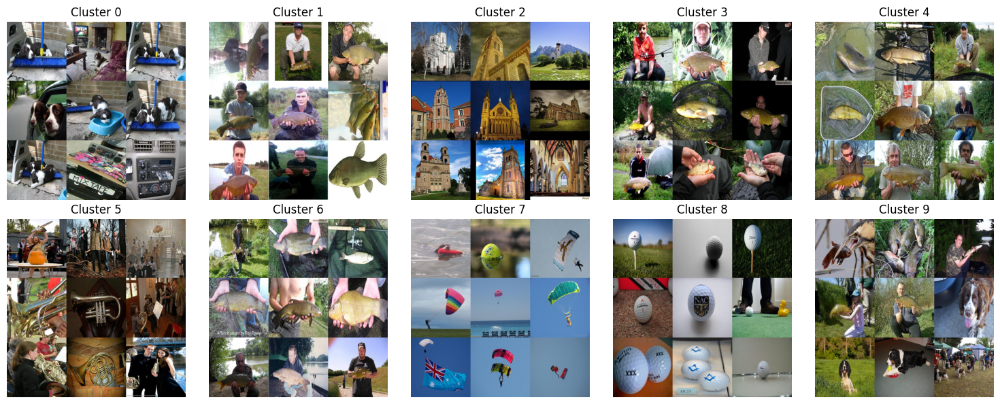

clustering of BIRCH


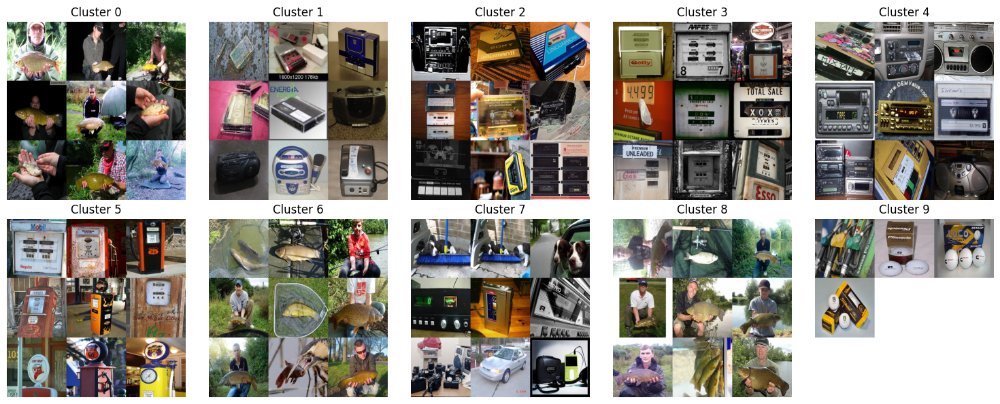

In [19]:
for key in labels_dict.keys():
    print(f"clustering of {key}")
    plot_cluster_images(dataloader.dataset._samples,  labels_dict[key], clusters_per_row=5, images_per_cluster=9)


# Clustering after applying Dimensionality Reduction 

Clustering high-dimensional embeddings (e.g. image or text vectors) can be both **computationally intensive** and **noisy**. Applying a light dimensionality reduction (DR) step—via PCA, UMAP or t-SNE—often yields tighter, more separable clusters, speeds up clustering, and filters out irrelevant variance.

**Computational Efficiency**  
Most clustering methods (k-means, DBSCAN/HDBSCAN, spectral) scale poorly with dimension. Reducing 512–1024-D embeddings down to 10–50 dimensions can cut runtime and memory by orders of magnitude, making large-scale clustering feasible again [paper](https://arxiv.org/abs/1802.03426).

**Noise Reduction & Cluster Tightness**  
High-D embeddings include many low-signal directions. PCA retains only top variance axes, which often correspond to meaningful structure; manifold methods (UMAP, t-SNE) further emphasize local neighborhoods, pulling true clusters closer together and leaving larger inter-cluster gaps [paper](https://arxiv.org/abs/2010.12100).

**Improved Accuracy**  
Empirical benchmarks on MNIST show k-means ARI rising from ≈0.37 on raw pixels to ≈0.76 after UMAP-50D, and DBSCAN/HDBSCAN ARI improving 2–3× post-DR [source](https://arxiv.org/abs/2002.08405).

**Caveat: Information Loss**  
PCA maximizes overall variance, not cluster separability. In gene-expression studies, clustering on the first few PCs often degraded true group recovery—important low-variance features were discarded [paper](https://doi.org/10.1093/bioinformatics/17.4.309).  

**Caveat: Distance Distortion**  
Nonlinear DR methods can introduce “tears” or artificial gaps, sometimes creating spurious clusters or splitting real ones, especially affecting density-based algorithms [source](https://umap-learn.readthedocs.io).

In summary, DR before clustering often **boosts performance and clarity**, but practitioners must guard against discarding or distorting the very signals they wish to discover.  


In [44]:
import numpy as np
import hdbscan
from sklearn.cluster import DBSCAN, KMeans, OPTICS, SpectralClustering, AgglomerativeClustering, Birch
from sklearn.metrics import pairwise_distances
from finch import FINCH
from time import time
from visualize import plot_label_distributions, apply_pca

reduced_features_50 = apply_pca(features, n_components=50)

# Execute and store results
hdbscan_labels, hdbscan_time, hdbscan_mem = cluster_and_time(run_hdbscan, reduced_features_50)
dbscan_labels, dbscan_time, dbscan_mem = cluster_and_time(run_dbscan, reduced_features_50)
optics_labels, optics_time, optics_mem = cluster_and_time(run_optics, reduced_features_50)

kmeans_labels, kmeans_time, kmeans_mem = cluster_and_time(run_kmeans, reduced_features_50)
kmeans_pp_labels, kmeans_pp_time, kmeans_pp_mem = cluster_and_time(run_kmeans_pp, reduced_features_50)

finch_labels, finch_time, finch_mem = cluster_and_time(run_finch, reduced_features_50, n_clusters=10)
hac_labels, hac_time, hac_mem = cluster_and_time(run_hac, reduced_features_50)
ward_labels, ward_time, ward_mem = cluster_and_time(run_ward, reduced_features_50)

spectral_labels, spectral_time, spectral_mem = cluster_and_time(run_spectral, reduced_features_50)

birch_labels, birch_time, birch_mem = cluster_and_time(run_birch, reduced_features_50)

# Summary
new_times = {
    'HDBSCAN': hdbscan_time,
    'DBSCAN': dbscan_time,
    'OPTICS': optics_time,
    'KMeans': kmeans_time,
    'KMeans++': kmeans_pp_time,
    'FINCH': finch_time,
    'HAC': hac_time,
    'Ward': ward_time,
    'Spectral': spectral_time,
    'BIRCH': birch_time,
}

new_memory_usage_mb = {
    'HDBSCAN': hdbscan_mem,
    'DBSCAN': dbscan_mem,
    'OPTICS': optics_mem,
    'KMeans': kmeans_mem,
    'KMeans++': kmeans_pp_mem,
    'FINCH': finch_mem,
    'HAC': hac_mem,
    'Ward': ward_mem,
    'Spectral': spectral_mem,
    'BIRCH': birch_mem,
}

new_labels_dict = {
    'HDBSCAN': hdbscan_labels,
    'DBSCAN': dbscan_labels,
    'KMeans': kmeans_labels,
    'KMeans++': kmeans_pp_labels,
    'FINCH': finch_labels,
    'OPTICS': optics_labels,
    'Spectral': spectral_labels,
    'HAC': hac_labels,
    'Ward': ward_labels,
    'BIRCH': birch_labels
}

/opt/anaconda3/envs/tutorial/lib/python3.11/multiprocessing/resource_tracker.py:123: UserWarning: resource_tracker: process died unexpectedly, relaunching.  Some resources might leak.
  warnings.warn('resource_tracker: process died unexpectedly, '
/opt/anaconda3/envs/tutorial/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/envs/tutorial/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Running: hdbscan
Running: dbscan
Running: dbscan
Running: optics
Running: kmeans
Running: kmeans_pp
Running: kmeans_pp
Running: finch
Partition 0: 1693 clusters
Partition 1: 288 clusters
Partition 2: 69 clusters
Partition 3: 23 clusters
Partition 4: 14 clusters
Running: hac
Running: ward
Running: spectral
Running: birch


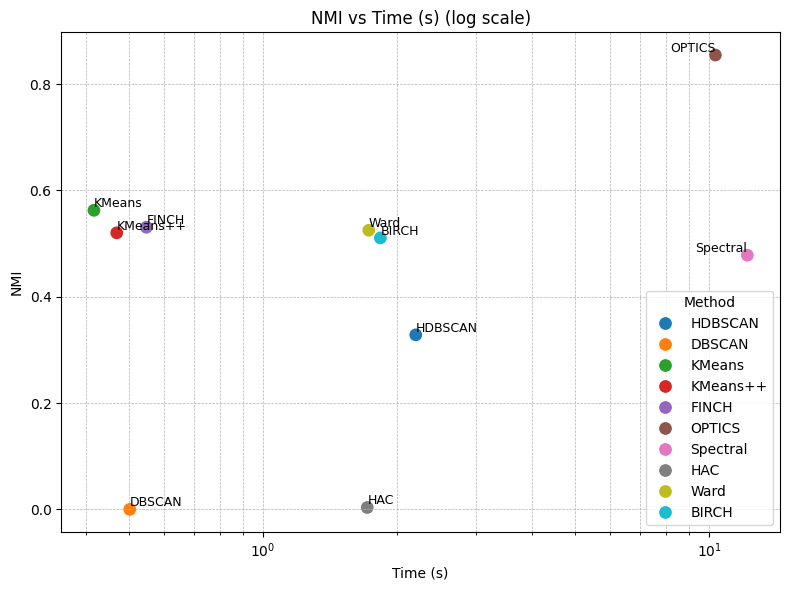

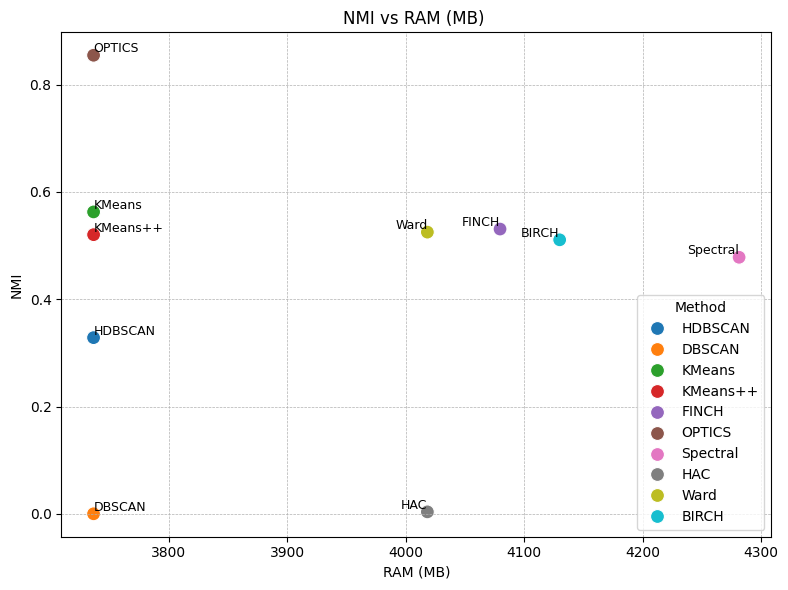

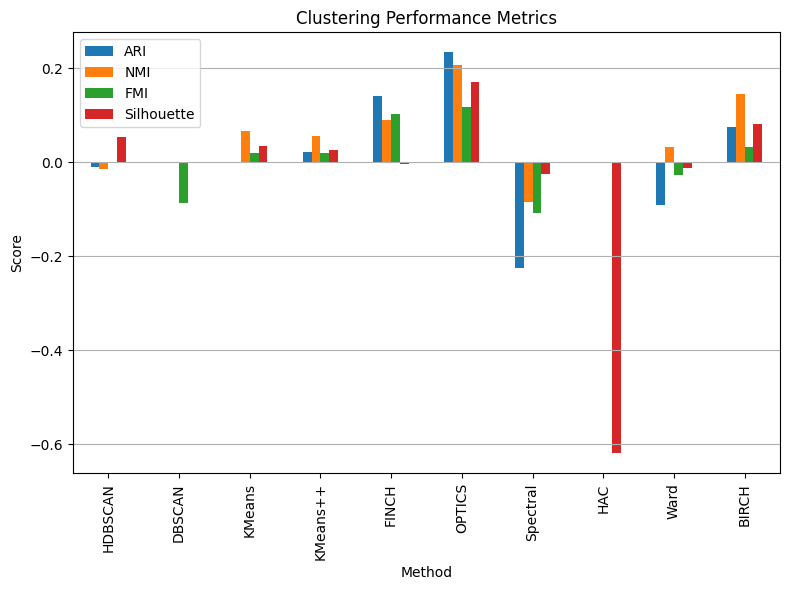

In [47]:
# # Evaluate all clusterings
new_results = {
    key: evaluate_clustering(new_labels_dict[key], labels, reduced_features) for key in new_labels_dict
}

reduced_feat_df = build_results_dataframe(new_results, new_times, new_memory_usage_mb)
plot_efficiency_vs_performance(reduced_feat_df, log_x=True)
plot_efficiency_vs_performance(reduced_feat_df, x_metric='RAM (MB)')

reduced_feat_df = reduced_feat_df - df
plot_performance_metrics(reduced_feat_df)


Original (High-Dimensional) Clustering Distributions


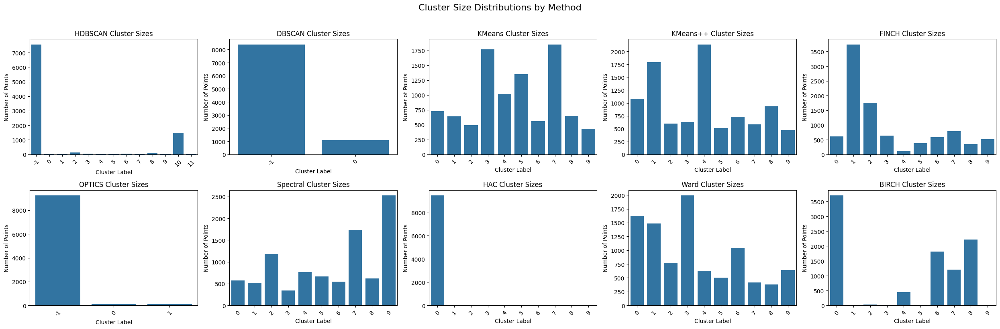

New (Low-Dimensional) Clustering Distributions


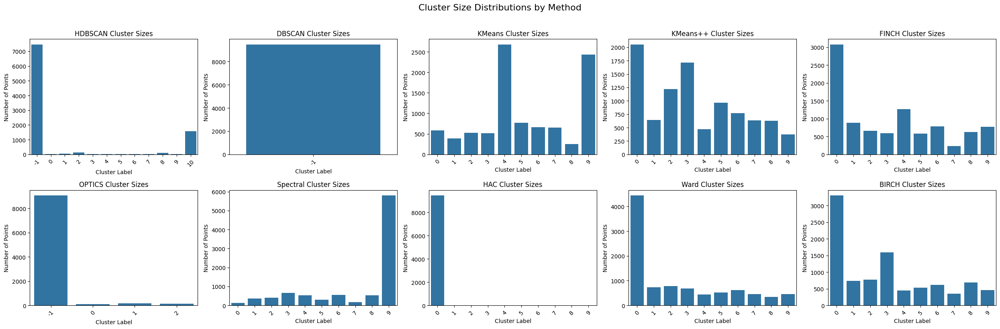

Original (High-Dimensional) Clustering Visualizations


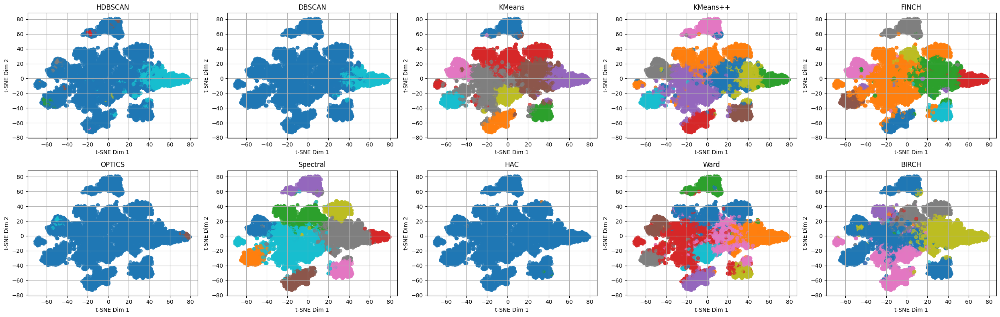

New (Low-Dimensional) Clustering Visualizations


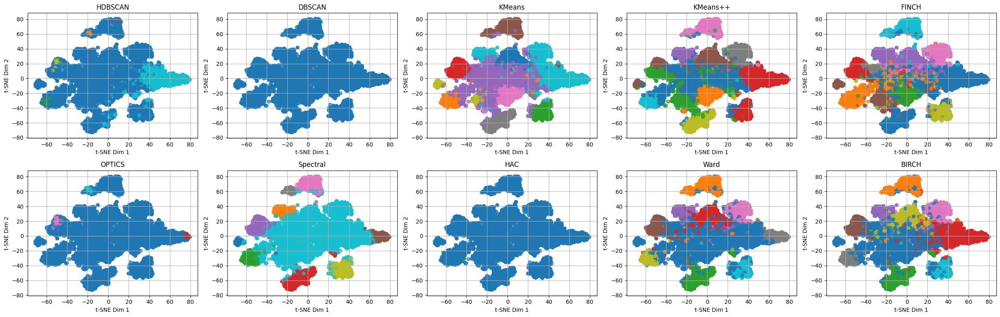

In [49]:
print('Original (High-Dimensional) Clustering Distributions')
plot_label_distributions(labels_dict)
print('New (Low-Dimensional) Clustering Distributions')
plot_label_distributions(new_labels_dict)

print('Original (High-Dimensional) Clustering Visualizations')
plot_multiple_tsne_variants(reduced_features, labels_dict.values(), list(labels_dict.keys()), n_cols=5)
print('New (Low-Dimensional) Clustering Visualizations')
plot_multiple_tsne_variants(reduced_features, new_labels_dict.values(), list(new_labels_dict.keys()), n_cols=5)
